#### This notebook is created as submission for Assignment 04, Advanced Machine Learning
Submitted by: Ruchi Sharma 

In [1]:
import warnings
warnings.filterwarnings("ignore")

### Question 1: Expected Loss Minimization [10 pts]
Consider a binary classification problem with the following loss matrix -
$$
   {\begin{array}{ccccc}
   & & \text{Predicted class} & \text{           } &\\
   & & C1 & C2 & Reject\\
   \text{True class} & C1 & 0 & r & c  \\
   & C2 & s & 0 & c \\
  \end{array} } 
$$

where the cost of rejection is a constant, and the costs $r$ and $s$ are positive real numbers. Let $f(x)=P(C1|x)$.

**(a) [2.5 points]** Show that the expected loss when $x$ is labelled as $C_1$ is a decreasing function of $f(x)$ while expected loss when $x$ is labelled as $C_2$ is a increasing function of $f(x)$.  

**(b) [2.5 points]** For $c=0$, show that the decision which minimizes the expected loss is to reject all instances of $x$

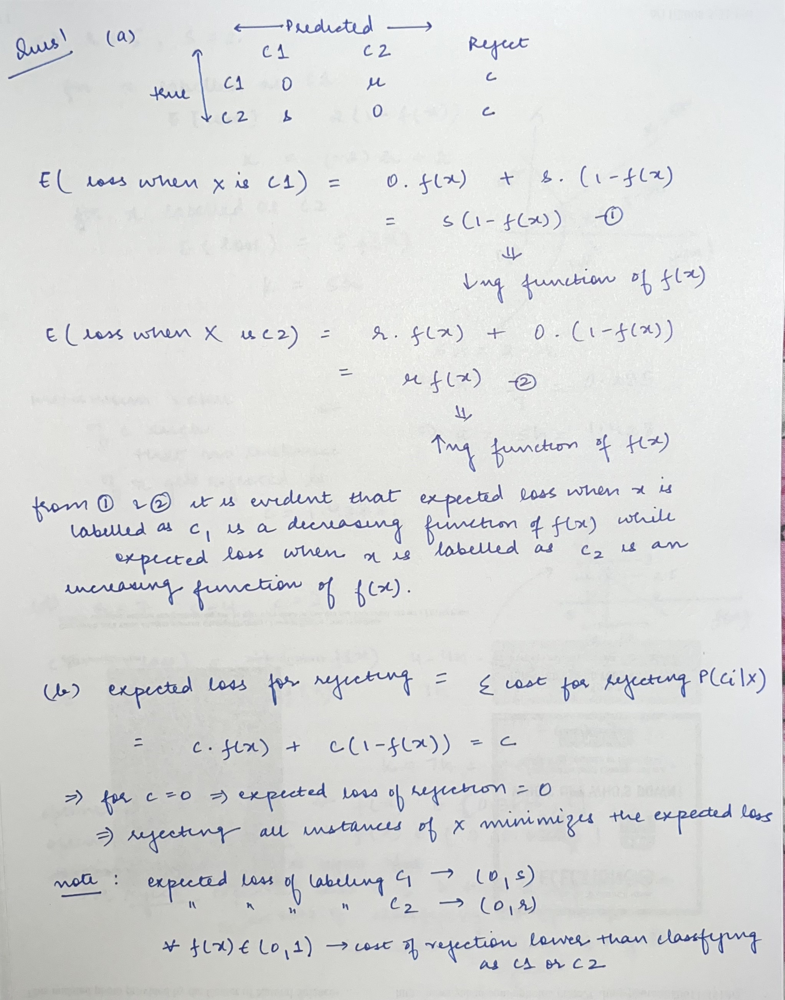

In [52]:
%matplotlib inline
from PIL import Image

Image.open("Q1AB.jpeg") 

**(c) [2.5 points]** Let $r=5$ and $s=2$, what is the minimum value of $c$ such that no instance of $x$ gets rejected (irrespective of  $f(x)$)?

**(d) [2.5 points]** Let $r=7$, $s=4$, and $c=3$. Determine the  ranges of $f(x)$ for which the optimal decision is C1, reject and C2 respectively.

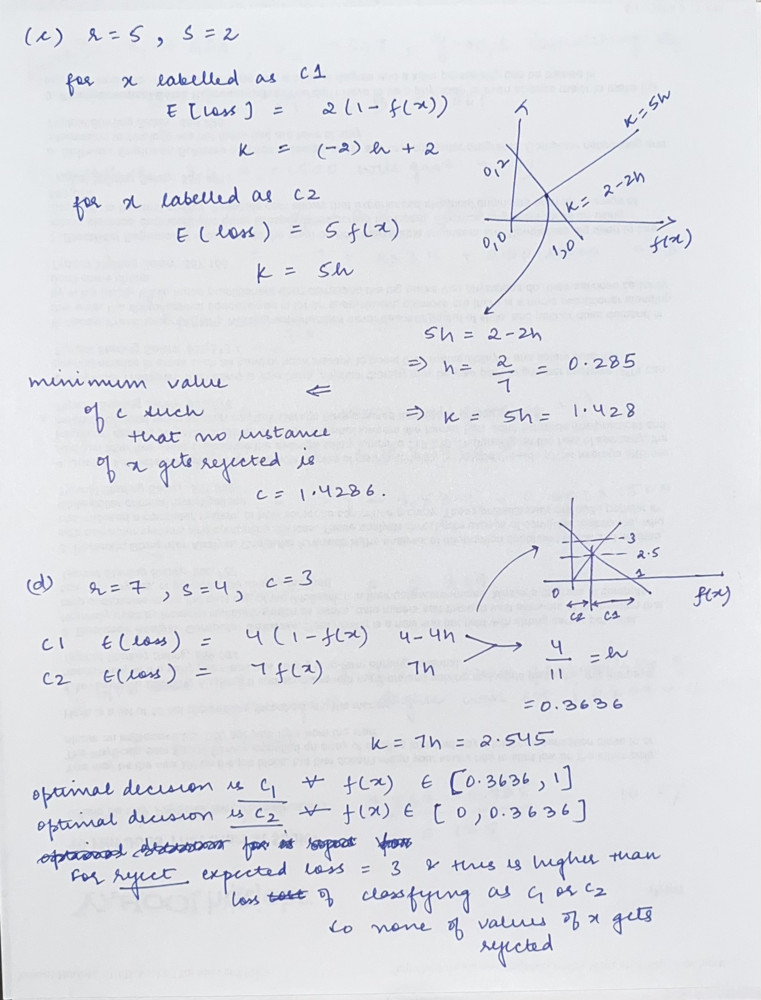

In [53]:
Image.open("Q1CD.jpeg") 

### Question 2: Logistic Regression [5 points]
Consider the problem of predicting the success of students in their undergraduate degrees given their high school GPA and SAT scores. We have the variables $X_1 =$ high school GPA, $X_2$ = SAT score and Y = completing the undergraduate degree (binary). We then fit a logistic regression which produces coefficients, $β_0 = −7$, $β_1 = 2$, $β_2 = 0.001$ Estimate the probability that George who
has a GPA of 3.4 and an SAT score of 1500 will complete his undergraduate degree successfully according to this model. By how much will the probability increase if the GPA increases to 3.7, with other factors remaining the same?

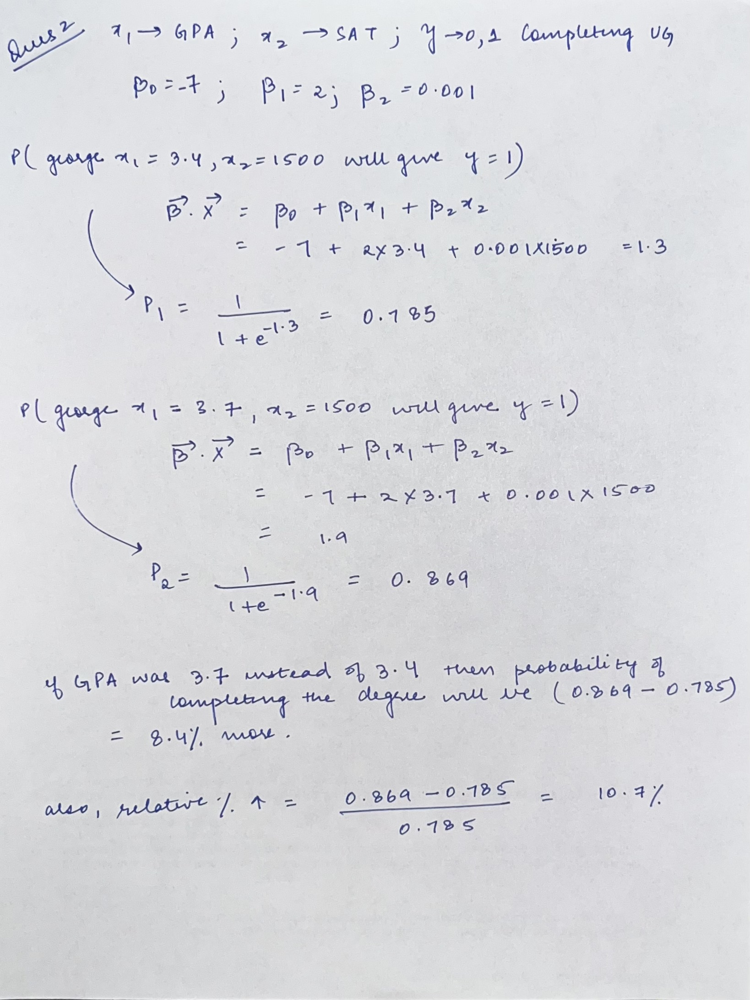

In [54]:
Image.open("Q2.jpeg") 


### Question 3: Classification and Handling Class Imbalance [35 points + 5 bonus points]

In [74]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from sklearn import metrics
from sklearn.metrics import confusion_matrix

df = pd.read_csv('customer_churn_telcom.csv')

In [75]:
# Printing the first five rows
df.head(5)

,Unnamed: 0,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,0,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,1,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,2,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,3,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,4,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [76]:
def print_unique_col_values(df):
       for column in df:
            if df[column].dtypes=='object':
                print(f'{column}: {df[column].unique()}') 

print_unique_col_values(df)

gender: ['Female' 'Male']
Partner: ['Yes' 'No']
Dependents: ['No' 'Yes']
PhoneService: ['No' 'Yes']
MultipleLines: ['No phone service' 'No' 'Yes']
InternetService: ['DSL' 'Fiber optic' 'No']
OnlineSecurity: ['No' 'Yes' 'No internet service']
OnlineBackup: ['Yes' 'No' 'No internet service']
DeviceProtection: ['No' 'Yes' 'No internet service']
TechSupport: ['No' 'Yes' 'No internet service']
StreamingTV: ['No' 'Yes' 'No internet service']
StreamingMovies: ['No' 'Yes' 'No internet service']
Contract: ['Month-to-month' 'One year' 'Two year']
PaperlessBilling: ['Yes' 'No']
PaymentMethod: ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
Churn: ['No' 'Yes']


### [5 points] Data Preprocessing 

(a) [1 pt] Some of the columns have values like - no internet service or no phone service. Replace these two values with with a simple No

In [77]:
# Replace values with No
df = df.replace('No phone service', 'No')
df = df.replace('No internet service', 'No')

(b) [1 pt] Convert all 'Yes' values to 1 and 'No' values to 0 <br>
(c) [1 pt] Convert all  'Female' values to 1 and 'Male' values to 0

In [78]:
# Changing values to 0/1

yes_no_columns = ['Partner','Dependents','PhoneService','MultipleLines','OnlineSecurity','OnlineBackup',
                'DeviceProtection','TechSupport','StreamingTV','StreamingMovies','PaperlessBilling','Churn']

df[yes_no_columns] = df[yes_no_columns].replace('No', 0)
df = df.replace('Yes', 1)
df = df.replace('Male', 0)
df = df.replace('Female', 1)

In [79]:
print_unique_col_values(df)

InternetService: ['DSL' 'Fiber optic' 'No']
Contract: ['Month-to-month' 'One year' 'Two year']
PaymentMethod: ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']


(d) [2 pts] Perform one-hot encoding on the folowing columns: 'InternetService', 'Contract', 'PaymentMethod'

In [80]:
# One hot encoding for categorical columns

k = ['InternetService', 'Contract', 'PaymentMethod']
df2 = pd.get_dummies(df, columns=k)

In [81]:
# Scaling

cols_to_scale = ['tenure','MonthlyCharges','TotalCharges']

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df2[cols_to_scale] = scaler.fit_transform(df2[cols_to_scale])

e) [1 pt] Split the dataset into training and test using a 80-20 split with a random state of 15. Perform stratified sampling on the target variable while doing so. Split the training data further into training (80%) and validation sets (20%) with a random state of 15. Perform stratified sampling on the target variable while doing so. \
Note: The 'stratify' parameter can be used for this in the train_test_split function. 

In [82]:
# Train test split

inputs = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'tenure', 'PhoneService', 'MultipleLines', 
          'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 
          'StreamingMovies', 'PaperlessBilling', 'MonthlyCharges', 'TotalCharges', 'InternetService_DSL', 
          'InternetService_Fiber optic', 'InternetService_No', 'Contract_Month-to-month', 'Contract_One year',
          'Contract_Two year', 'PaymentMethod_Bank transfer (automatic)', 
          'PaymentMethod_Credit card (automatic)','PaymentMethod_Electronic check', 
          'PaymentMethod_Mailed check']

outputs = ['Churn']

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df2[inputs], df2[outputs], test_size=0.20, random_state=15, 
                                                            stratify = df2[outputs])

y = df[outputs]

In [83]:
print('Churn occurences in the training set \n', y_train.value_counts())
print('\n')
print('Churn occurences throughout the data \n', y.value_counts())

Churn occurences in the training set 
 Churn
0        4130
1        1495
dtype: int64


Churn occurences throughout the data 
 Churn
0        5163
1        1869
dtype: int64


In [84]:
from sklearn.model_selection import train_test_split
X_train_2, X_cv, y_train_2, y_cv = train_test_split(X_train, y_train, test_size=0.20, random_state=15, 
                                                            stratify = y_train)

In [85]:
# With samples corresponding to the positive class being very low, we can clearly see 
# the imbalance in our data 

print('Churn occurences in the training set \n', y_train_2.value_counts())
print('\n')
print('Churn occurences throughout the data \n', y.value_counts())

Churn occurences in the training set 
 Churn
0        3304
1        1196
dtype: int64


Churn occurences throughout the data 
 Churn
0        5163
1        1869
dtype: int64


### [15 points] Decision Trees, Logistic Regression, and MLP

Use the example provided [here](https://scikit-learn.org/stable/modules/tree.html) to get an idea of how to use sklearn's decision tree classifier. \
Go through the documentation [here](https://scikit-learn.org/0.16/modules/generated/sklearn.linear_model.LogisticRegression.html) to understand how to use sklearn's logistic regression model. \
Go through the documentation [here](https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPClassifier.html) to understand how to use sklearn's MLP Model.

(a) [5 pts (+5 bonus points)] Train the three classifiers on the dataset and print confusion matrix on both - the validation data as well as the test data for all the three models (you can either use default parameters for MLP classifier or change them to obtain higher performance for additional bonus of 5 points). <br>
(b) [5 pts] Plot the ROC Curves for all the three classifiers in a single graph and display the AUC-ROC scores for all the classifiers in this plot as well. Use both the validation and the test data to plot these curves as well as to calculate the AUC-ROC scores. Use one graph for validation data and one graph for test data (all models for validation data in one graph and all models for test data in one graph - and use this scheme for plotting in all subsequent plotting questions). <br>
(c) [5 pts] Plot the Precision-Recall curves for all the three classifiers in a single graph. Use both the validation and the test data to plot these curves. Use one graph for validation data and one graph for test data.

Helpful resources can be found here - 
1. [sklearn.tree.DecisionTreeClassifier.score](https://github.com/scikit-learn/scikit-learn/blob/37ac6788c/sklearn/base.py#L625)
2.  [sklearn.linear_model.LogisticRegression.score](https://github.com/scikit-learn/scikit-learn/blob/37ac6788c/sklearn/base.py#L625)
3. [sklearn.neutral_network.MLPClassifier.score](https://github.com/scikit-learn/scikit-learn/blob/36958fb24/sklearn/base.py#L640)
4. [sklearn.metrics.plot_roc_curve](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.plot_roc_curve.html)
5. [sklearn.metrics_confusion_matrix](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html)

Note: In this question, we are using the default parameters for MLP classifier, but you can change these parameters to obtain higher accuracies. **For a bonus of 5 points, experiment with these parameters to obtain a higher performance (in terms of accuracy and AUC-ROC scores).**

In [86]:
# Decision Tree Classifier
from sklearn import tree
from sklearn.metrics import confusion_matrix

clf = tree.DecisionTreeClassifier(random_state = 15) 
clf = clf.fit(X_train_2, y_train_2)

y_pred_cv = clf.predict(X_cv)
y_pred_test = clf.predict(X_test)

print("Decision Tree Classifier")

print("\nFor Validation Set: \n", confusion_matrix(y_cv, y_pred_cv))
print("\nFor Test Set: \n", confusion_matrix(y_test, y_pred_test))

Decision Tree Classifier

For Validation Set: 
 [[652 174]
 [149 150]]

For Test Set: 
 [[836 197]
 [197 177]]


In [87]:
from sklearn.metrics import classification_report
print("\nFor Validation Set: \n", classification_report(y_cv, y_pred_cv))
print("\nFor Test Set: \n", classification_report(y_test, y_pred_test))


For Validation Set: 
               precision    recall  f1-score   support

           0       0.81      0.79      0.80       826
           1       0.46      0.50      0.48       299

    accuracy                           0.71      1125
   macro avg       0.64      0.65      0.64      1125
weighted avg       0.72      0.71      0.72      1125


For Test Set: 
               precision    recall  f1-score   support

           0       0.81      0.81      0.81      1033
           1       0.47      0.47      0.47       374

    accuracy                           0.72      1407
   macro avg       0.64      0.64      0.64      1407
weighted avg       0.72      0.72      0.72      1407



In [88]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression()
logreg = logreg.fit(X_train_2, y_train_2)

y_pred_cv_lr = logreg.predict(X_cv)
y_pred_test_lr = logreg.predict(X_test)

print("Logistic Regression")

print("\nFor Validation Set: \n", confusion_matrix(y_cv, y_pred_cv_lr))
print("\nFor Test Set: \n", confusion_matrix(y_test, y_pred_test_lr))

Logistic Regression

For Validation Set: 
 [[734  92]
 [143 156]]

For Test Set: 
 [[929 104]
 [170 204]]


In [89]:
print("\nFor Validation Set: \n", classification_report(y_cv, y_pred_cv_lr))
print("\nFor Test Set: \n", classification_report(y_test, y_pred_test_lr))


For Validation Set: 
               precision    recall  f1-score   support

           0       0.84      0.89      0.86       826
           1       0.63      0.52      0.57       299

    accuracy                           0.79      1125
   macro avg       0.73      0.71      0.72      1125
weighted avg       0.78      0.79      0.78      1125


For Test Set: 
               precision    recall  f1-score   support

           0       0.85      0.90      0.87      1033
           1       0.66      0.55      0.60       374

    accuracy                           0.81      1407
   macro avg       0.75      0.72      0.73      1407
weighted avg       0.80      0.81      0.80      1407



In [90]:
# MLP Classifier (Default Parameters)
from sklearn.neural_network import MLPClassifier

classifier = MLPClassifier(random_state = 15)

classifier = classifier.fit(X_train_2, y_train_2)

y_pred_cv_mlp = classifier.predict(X_cv)
y_pred_test_mlp = classifier.predict(X_test)

print("MLP Default")

print("\nFor Validation Set:\n", confusion_matrix(y_cv, y_pred_cv_mlp))
print("\nFor Test Set:\n", confusion_matrix(y_test, y_pred_test_mlp))
# print(classification_report(y_test, y_pred_test_mlp))

MLP Default

For Validation Set:
 [[699 127]
 [126 173]]

For Test Set:
 [[896 137]
 [165 209]]


In [91]:
print("\nFor Validation Set: \n", classification_report(y_cv, y_pred_cv_mlp))
print("\nFor Test Set: \n", classification_report(y_test, y_pred_test_mlp))


For Validation Set: 
               precision    recall  f1-score   support

           0       0.85      0.85      0.85       826
           1       0.58      0.58      0.58       299

    accuracy                           0.78      1125
   macro avg       0.71      0.71      0.71      1125
weighted avg       0.78      0.78      0.78      1125


For Test Set: 
               precision    recall  f1-score   support

           0       0.84      0.87      0.86      1033
           1       0.60      0.56      0.58       374

    accuracy                           0.79      1407
   macro avg       0.72      0.71      0.72      1407
weighted avg       0.78      0.79      0.78      1407



In [92]:
# MLP Classifier

classifier2 = MLPClassifier(hidden_layer_sizes = (150, 100, 50), max_iter = 300, activation = 'relu', solver = 'adam', random_state = 1)
classifier2 = classifier2.fit(X_train_2, y_train_2)

y_pred_cv_mlp = classifier2.predict(X_cv)
y_pred_test_mlp = classifier2.predict(X_test)

print("MLP Manual Setting Toggle")

print("\nFor Validation Set:\n", confusion_matrix(y_cv, y_pred_cv_mlp))
print("\nFor Test Set:\n", confusion_matrix(y_test, y_pred_test_mlp))

''# print(classification_report(y_test, y_pred_test_mlp))

MLP Manual Setting Toggle

For Validation Set:
 [[689 137]
 [146 153]]

For Test Set:
 [[861 172]
 [195 179]]


In [63]:
'''
from sklearn.model_selection import GridSearchCV

params = {
    "hidden_layer_sizes": [(100,), (50, 40, 30), (10, 10, 10, 10), (50,), (30, 30, 30)],
    "alpha": [0.00001, 0.0001, 0.001, 0.01, 0.1],
    "activation": ['tanh','relu'],
    "solver": ['adam','sgd'],
    "learning_rate_init": [0.0001, 0.001, 0.01, 0.1,1]    
}

mlp_best = GridSearchCV(MLPClassifier(random_state = 15), params)
mlp_best.fit(X_train_2, y_train_2)
'''

GridSearchCV(estimator=MLPClassifier(random_state=15),
             param_grid={'activation': ['tanh', 'relu'],
                         'alpha': [1e-05, 0.0001, 0.001, 0.01, 0.1],
                         'hidden_layer_sizes': [(100,), (50, 40, 30),
                                                (10, 10, 10, 10), (50,),
                                                (30, 30, 30)],
                         'learning_rate_init': [0.0001, 0.001, 0.01, 0.1, 1],
                         'solver': ['adam', 'sgd']})

In [97]:
'''
best_params = mlp_best.cv_results_['params'][mlp_best.best_index_]
print(best_params)
'''

best_params = {'activation': 'tanh', 'alpha': 0.1, 'hidden_layer_sizes': (100,), 
               'learning_rate_init': 0.001, 'solver': 'adam'}

mlp_final = MLPClassifier(activation = best_params['activation'],
                               hidden_layer_sizes = best_params['hidden_layer_sizes'],
                               alpha = best_params['alpha'],
                               learning_rate_init = best_params['learning_rate_init'],
                               solver = best_params['solver'])

mlp_final = mlp_final.fit(X_train_2, y_train_2)

y_pred_cv_mlp_final = mlp_final.predict(X_cv)
y_pred_test_mlp_final = mlp_final.predict(X_test)

print("MLP with Updated Parameters")

print("\nFor Validation Set:\n", confusion_matrix(y_cv, y_pred_cv_mlp_final))
print("\nFor Test Set:\n", confusion_matrix(y_test, y_pred_test_mlp_final))

MLP with Updated Parameters

For Validation Set:
 [[738  88]
 [147 152]]

For Test Set:
 [[940  93]
 [175 199]]


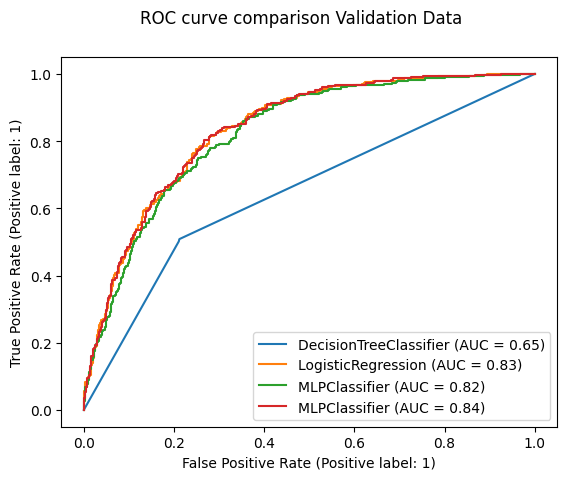

In [98]:
# Plot ROC curves - Validation Data

import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.metrics import RocCurveDisplay

fig = RocCurveDisplay.from_estimator(clf, X_cv, y_cv)
fig = RocCurveDisplay.from_estimator(logreg, X_cv, y_cv, ax=fig.ax_)
fig = RocCurveDisplay.from_estimator(classifier, X_cv, y_cv, ax=fig.ax_) # default MLP
fig = RocCurveDisplay.from_estimator(mlp_final, X_cv, y_cv, ax=fig.ax_) # updated MLP

fig.figure_.suptitle("ROC curve comparison Validation Data")
fig.set_size_inches=((12,7.5))

plt.show()

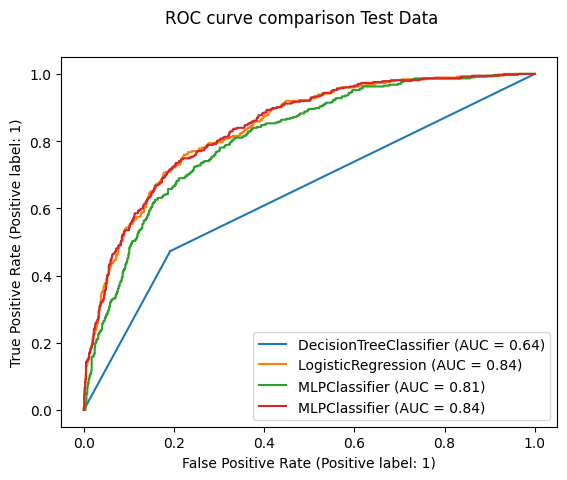

In [99]:
# Plot ROC curves - Test Data

import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.metrics import RocCurveDisplay

fig = RocCurveDisplay.from_estimator(clf, X_test, y_test)
fig = RocCurveDisplay.from_estimator(logreg, X_test, y_test, ax=fig.ax_)
fig = RocCurveDisplay.from_estimator(classifier, X_test, y_test, ax=fig.ax_)
fig = RocCurveDisplay.from_estimator(mlp_final, X_test, y_test, ax=fig.ax_)

fig.figure_.suptitle("ROC curve comparison Test Data")
fig.set_size_inches=((12,7.5))

plt.show()

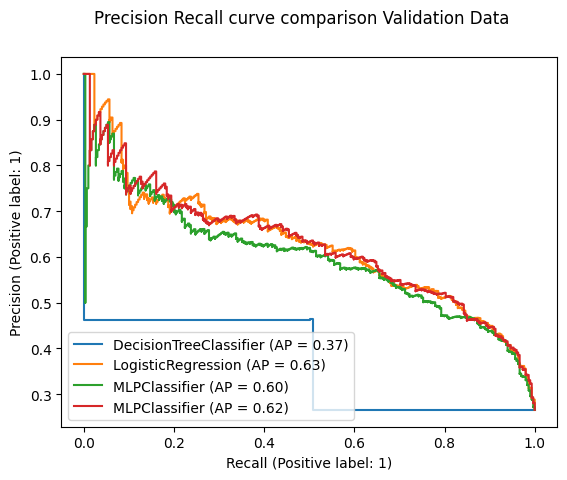

In [100]:
# Plot PR curves - Valiation Data 

from sklearn.metrics import PrecisionRecallDisplay

fig = PrecisionRecallDisplay.from_estimator(clf, X_cv, y_cv)
fig = PrecisionRecallDisplay.from_estimator(logreg, X_cv, y_cv, ax=fig.ax_)
fig = PrecisionRecallDisplay.from_estimator(classifier, X_cv, y_cv, ax=fig.ax_)
fig = PrecisionRecallDisplay.from_estimator(mlp_final, X_cv, y_cv, ax=fig.ax_)
fig.figure_.suptitle("Precision Recall curve comparison Validation Data")
fig.set_size_inches=((12,7.5))
plt.show()

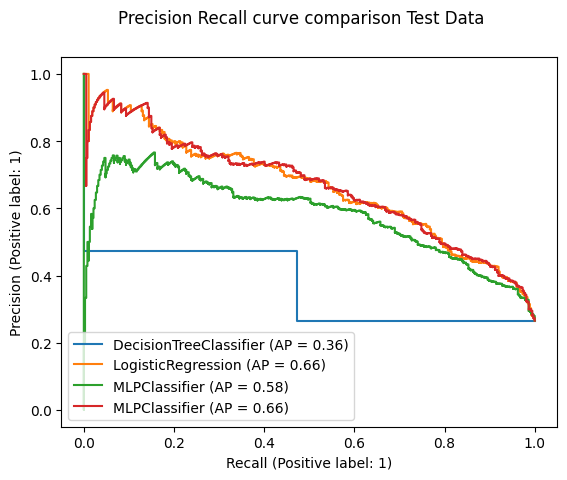

In [101]:
# Plot PR curves - Test Data 

from sklearn.metrics import PrecisionRecallDisplay

fig = PrecisionRecallDisplay.from_estimator(clf, X_test, y_test)
fig = PrecisionRecallDisplay.from_estimator(logreg, X_test, y_test, ax=fig.ax_)
fig = PrecisionRecallDisplay.from_estimator(classifier, X_test, y_test, ax=fig.ax_)
fig = PrecisionRecallDisplay.from_estimator(mlp_final, X_test, y_test, ax=fig.ax_)

fig.figure_.suptitle("Precision Recall curve comparison Test Data")
fig.set_size_inches=((12,7.5))
plt.show()

### [4 points] Handling Class Imbalance with SMOTE

Go through the documentation [here](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html) to understand how to use imbalanced-learn's SMOTE to counter class imbalance in the data.

(a) [1 pt] Split the data into training (80%) and test sets (20%) with a random state of 15. Perform stratified sampling on the target variable while doing so. \
Note: The 'stratify' parameter can be used for this in the train_test_split function. 

In [37]:
X = df2.drop('Churn',axis='columns')
y = df2['Churn']

# Train test split

X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(X, y, test_size=0.20, random_state=15, 
                                                            stratify = y)

(b) [2 pts] Perform SMOTE on the training data and print the value counts of the target variable in the data.

In [38]:
# To install imbalanced-learn library use pip install imbalanced-learn command

from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=42)
X_res, y_res = sm.fit_resample(X_train_s, y_train_s)

y_res.value_counts()

0    4130
1    4130
Name: Churn, dtype: int64

(c) [1 pt] Split the updated training data (on which SMOTE has been run) further into training (80%) and validation sets (20%) with a random state of 15. Perform stratified sampling on the target variable while doing so.

Note: The 'stratify' parameter can be used for this in the train_test_split function. 

In [39]:
X_train_s2, X_test_s2, y_train_s2, y_test_s2 = train_test_split(X_res, y_res, test_size=0.20, random_state=15, 
                                                            stratify = y_res)

In [41]:
# Number of classes in training Data
# train_y.value_counts()

y_train_s2.value_counts()

1    3304
0    3304
Name: Churn, dtype: int64

In [42]:
# Number of classes in validation Data
# validation_y.value_counts()

y_test_s2.value_counts()

1    826
0    826
Name: Churn, dtype: int64

### [2 points] Retraining the Classifiers

Now that we have created synthetic samples of the minority class, let's proceed further to see if we see any improvements in our results. For the two models - Logistic regressor and MLP, do the folowing: \
(a) [1 pt] Train a model on the training dataset. <br>
(b) [1 pt] Make predictions on the test data using the trained model and print confusion matrix for both - the validation and the test data.

In [43]:
# Logistic Regression

logreg_r = LogisticRegression()
logreg_r = logreg.fit(X_train_s2, y_train_s2)

y_pred_s = logreg.predict(X_test_s2) #cv
y_pred_test_s = logreg.predict(X_test_s) #test

print("Logistic Regression")

print("\nFor Validation Set: \n", confusion_matrix(y_test_s2, y_pred_s))
print("\nFor Test Set: \n", confusion_matrix(y_test_s, y_pred_test_s))

Logistic Regression

For Validation Set: 
 [[664 162]
 [112 714]]

For Test Set: 
 [[837 196]
 [133 241]]


In [70]:
print("\nFor Validation Set: \n", classification_report(y_test_s2, y_pred_s))
print("\nFor Test Set: \n", classification_report(y_test_s, y_pred_test_s))


For Validation Set: 
               precision    recall  f1-score   support

           0       0.86      0.80      0.83       826
           1       0.82      0.86      0.84       826

    accuracy                           0.83      1652
   macro avg       0.84      0.83      0.83      1652
weighted avg       0.84      0.83      0.83      1652


For Test Set: 
               precision    recall  f1-score   support

           0       0.86      0.81      0.84      1033
           1       0.55      0.64      0.59       374

    accuracy                           0.77      1407
   macro avg       0.71      0.73      0.72      1407
weighted avg       0.78      0.77      0.77      1407



In [47]:
# MLP Default

classifier3 = MLPClassifier(random_state = 15)
classifier3 = classifier3.fit(X_train_s2, y_train_s2)

y_pred_s_mlp = classifier3.predict(X_test_s2) #cv
y_pred_test_s_mlp = classifier3.predict(X_test_s) #test

print("MLP with Default Parameters")

print("\nFor Validation Set: \n", confusion_matrix(y_test_s2, y_pred_s_mlp))
print("\nFor Test Set: \n", confusion_matrix(y_test_s, y_pred_test_s_mlp))

MLP with Default Parameters

For Validation Set: 
 [[638 188]
 [104 722]]

For Test Set: 
 [[801 232]
 [111 263]]


In [71]:
print("\nFor Validation Set: \n", classification_report(y_test_s2, y_pred_s_mlp))
print("\nFor Test Set: \n", classification_report(y_test_s, y_pred_test_s_mlp))


For Validation Set: 
               precision    recall  f1-score   support

           0       0.86      0.77      0.81       826
           1       0.79      0.87      0.83       826

    accuracy                           0.82      1652
   macro avg       0.83      0.82      0.82      1652
weighted avg       0.83      0.82      0.82      1652


For Test Set: 
               precision    recall  f1-score   support

           0       0.88      0.78      0.82      1033
           1       0.53      0.70      0.61       374

    accuracy                           0.76      1407
   macro avg       0.70      0.74      0.71      1407
weighted avg       0.79      0.76      0.77      1407



### [9 points] Plotting and Comparison
a) [1 pt] For the two classifiers (Logistic regression and MLP) - plot the ROC Curves in a single graph, display the AUC-ROC scores in this plot as well on both the validation and the test data. Use one graph for validation data and one graph for test data. <br>
b) [1 pt] Plot the Precision-Recall curves for the two classifiers in a single graph on both the validation and the test data. Use one graph for validation data and one graph for test data. <br>
c) [7 pts] Compare and contrast the performance of the classifiers with reference to these two plots and with reference to the plots that were computed before using SMOTE. Specifically comment on what you observed regarding the difference in performance on the validation vs. the test dataset, which is a better representative of the actual/original problem.

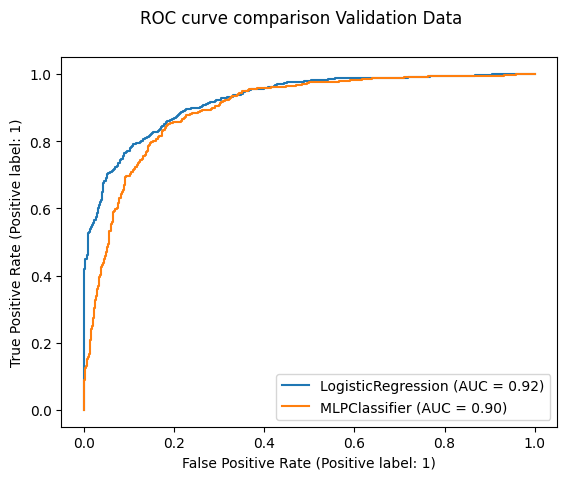

In [49]:
# Plot ROC curves - Validation Data

fig = RocCurveDisplay.from_estimator(logreg_r, X_test_s2, y_test_s2)
fig = RocCurveDisplay.from_estimator(classifier3, X_test_s2, y_test_s2, ax=fig.ax_)
fig.figure_.suptitle("ROC curve comparison Validation Data")
fig.set_size_inches=((12,7.5))
plt.show()

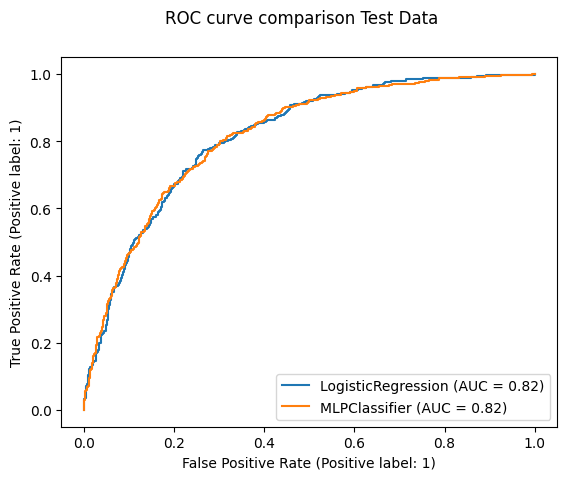

In [48]:
# Plot ROC curves - Test Data

fig = RocCurveDisplay.from_estimator(logreg_r, X_test_s, y_test_s)
fig = RocCurveDisplay.from_estimator(classifier3, X_test_s, y_test_s, ax=fig.ax_)
fig.figure_.suptitle("ROC curve comparison Test Data")
fig.set_size_inches=((12,7.5))
plt.show()

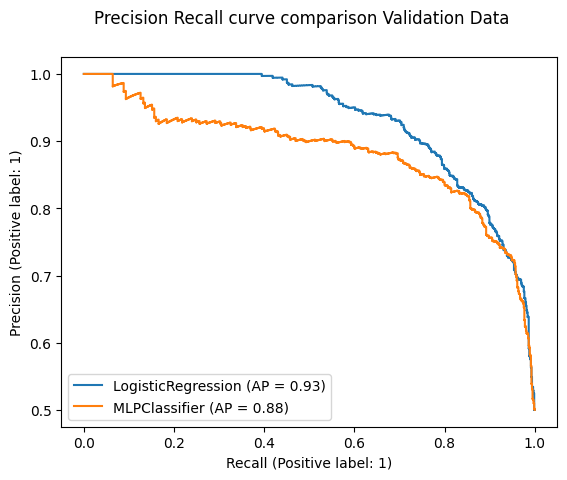

In [50]:
# Plot PR curves - Validation

fig = PrecisionRecallDisplay.from_estimator(logreg_r, X_test_s2, y_test_s2)
fig = PrecisionRecallDisplay.from_estimator(classifier3, X_test_s2, y_test_s2, ax=fig.ax_)
fig.figure_.suptitle("Precision Recall curve comparison Validation Data")
fig.set_size_inches=((12,7.5))
plt.show()

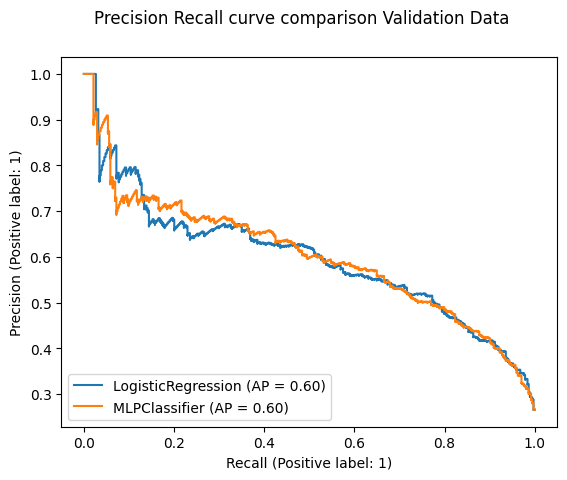

In [51]:
# Plot PR curves - Test 

fig = PrecisionRecallDisplay.from_estimator(logreg_r, X_test_s, y_test_s)
fig = PrecisionRecallDisplay.from_estimator(classifier3, X_test_s, y_test_s, ax=fig.ax_)
fig.figure_.suptitle("Precision Recall curve comparison Test Data")
fig.set_size_inches=((12,7.5))
plt.show()

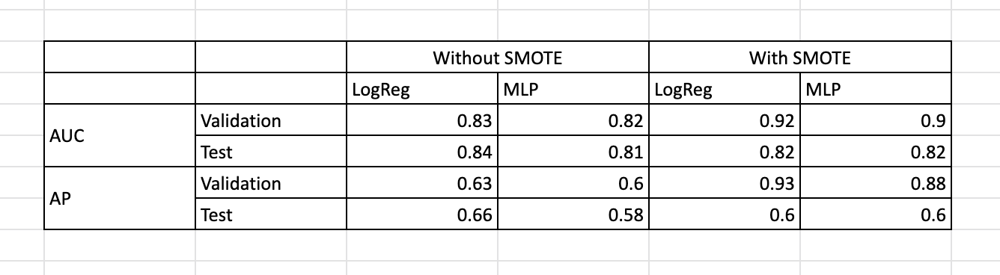

In [55]:
Image.open("h4q3.png") 

For Validation Set, there is some improvement in Logistic Regression as well as MLP in the AUC metric. Further, AP seems to improve considerable in both the cases. Further, Test set AUC doesn't seems to show a very significant improvement. Similar is the case with test AP metric. Infact, we can also see a slight dip in case of logistic regression. So, although we can see a significant improvement in validation set but the fact that test set metrics don't change much is rather essential. Eventually, we want the test set metrics to improve as that is a correct representation of the unseen data. 

##### Compairing F1 Metrics: 

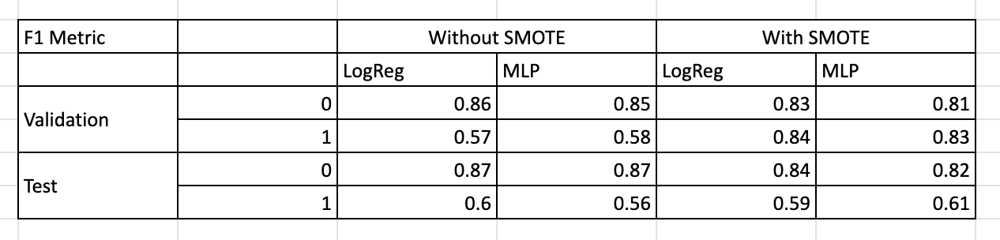

In [102]:
Image.open("f1.png") 

On the basis of F1 scores as well, a significant improvement is not observed. This could mean that class imbalance adjustements don't reflect the actual data setting. 

### Question 4: Bayesian Belief Networks [15 pts]



Refer to the Bayesian Network Belief image (uploaded with the notebook on canvas) for this question. 

All nodes are binary and can take 0/1 values \
The probabilities are given below: \
P(Season = 1) = .001   
P(Atmospheric Pressure = 1) = .0.002

P(Rain = 1 | Season = 0, Atmospheric Pressure = 0) = .001  
P(Rain = 1 | Season = 0, Atmospheric Pressure = 1) = .29  
P(Rain = 1 | Season = 1, Atmospheric Pressure = 0) = .94  
P(Rain = 1 | Season = 1, Atmospheric Pressure = 1) = .95

P(Umbrella = 1 | Rain = 1) = .9  
P(Umbrella = 1 | Rain = 0) = .05

For the given Bayesian network, Compute the following probabilities : 

**(a) [4 pts]** Find the probability that  Umbrella = 0 

**(b) [4 pts]** Given that there is low Atmospheric Pressure (Atmospheric Pressure = 0), what is the probability that Rain = 1

**(c) [7 pts]** Given that it rains(Rain = 1), what is the probability that the it is rainy season (Season = 1)

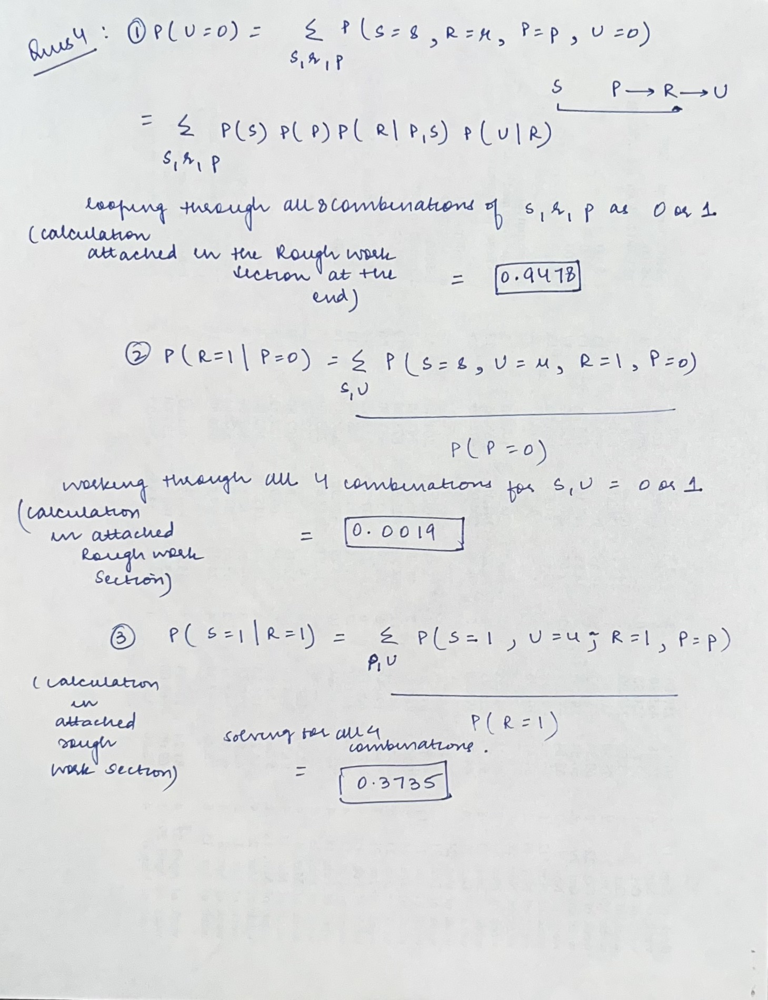

In [56]:
Image.open("Q4.jpeg") 

##### Note: Calculations have been explained in the Rough Work below 

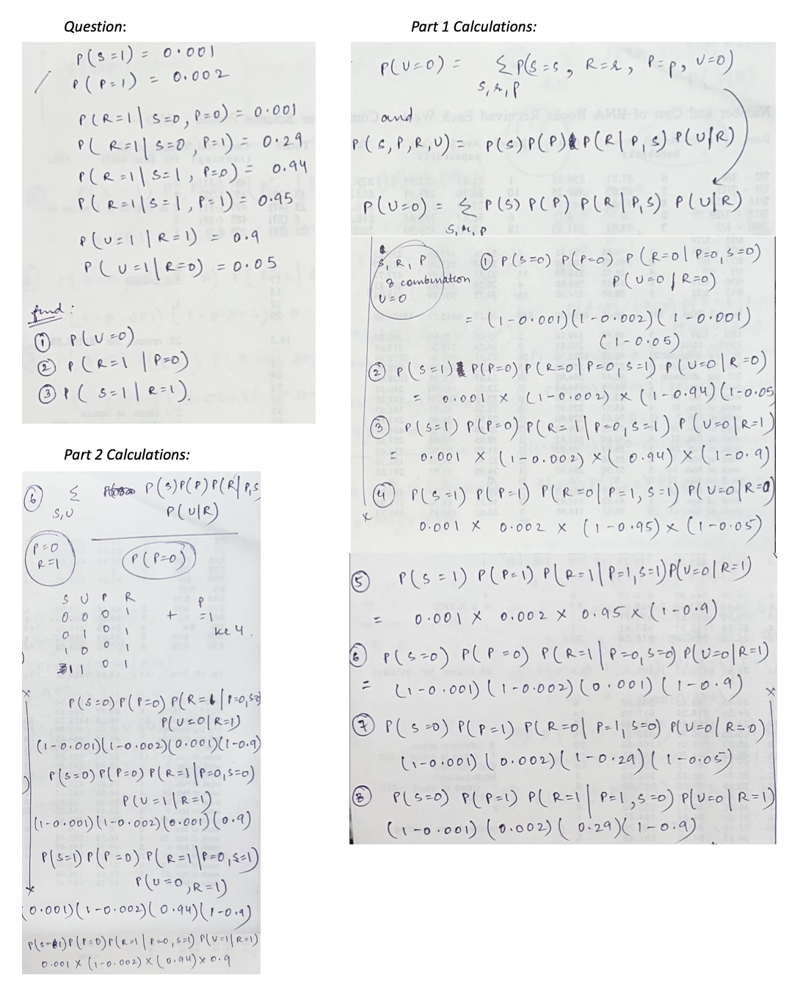

In [57]:
Image.open("RW1.png") 

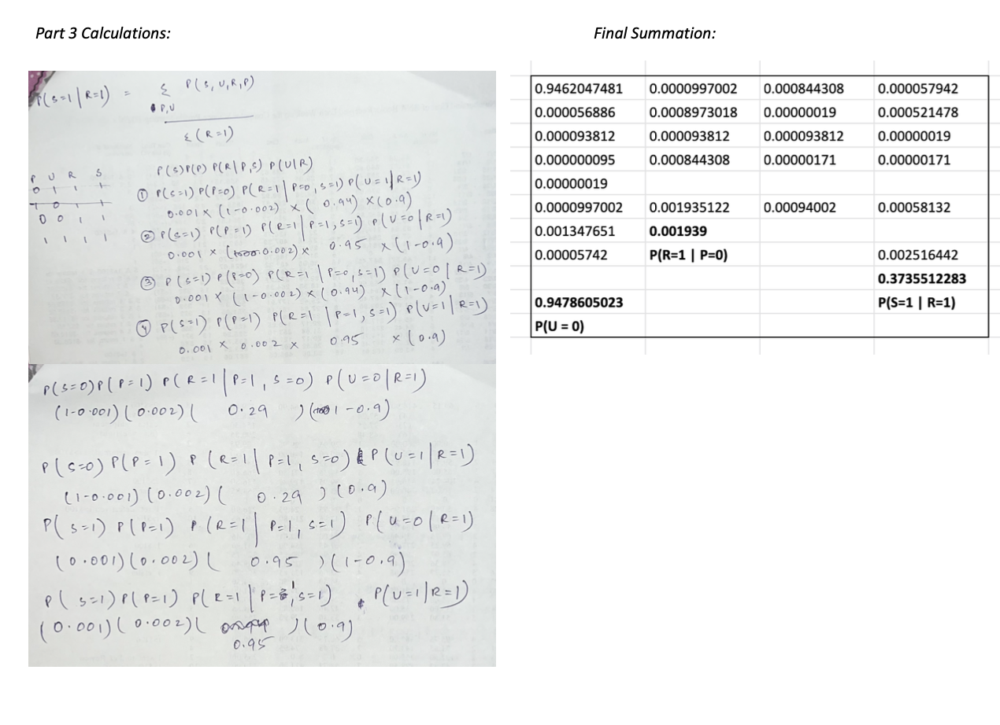

In [58]:
Image.open("RW2.png")

### Question 5: Support Vector Machines [10 pts]

1. [3 pts] Explain in what sense the Support Vector Machine seeks an optimal answer in the space of linear classifiers.

By default SVM works as a linear classifier when it maps a linear function of the n-dimensional input data onto a feature space where class separation can occur using a (n-1) dimensional hyperplane. But when it uses a kernel, then it maps a non-linear function of the input data onto the feature space, and then it is said to work in a non-linear mode. But even in the case for a non-linear feature space, SVM can produce a linear boundary in a transformed feature space. 

At first approximation what SVMs do is to find a separating line(or hyperplane) between data of two classes. 
The resulting learning algorithm is an optimization algorithm rather than a greedy search.

The basic idea of support vector machines is to achieve an optimal hyperplane for linearly separable patterns. It can further be extended to seemingly non-linear patterns by transformations of orginal data to map into new space. We can also introduce kernel functions in case the patterns are not linearly separable even after transformation. 

Support Vectors are the data points that lie closest to the decision surface (hyperplane) and are most difficult to classify. They have direct bearing on the optimum location of the decision surface. It can be shown that the optimal hyperplance stems from the fucntion class with the lowest capacity (= # of independent features or parameters we can twiddle).  

SVMs work by maximizing the margin, around the separating hyperplane. The decision function is fully
specified by a (usually very small) subset of training samples, the support vectors. This becomes a Quadratic
programming problem that is easy to solve by standard methods. 

2. [3 pts] Describe how a slack variable works.

The standard SVM classifier works only if you have a well separated categories. To be more specific, they need to be linearly separable. It means there exist a line (or hyperplane) such that all points belonging to a single category are either below or above it. In many cases that condition is not satisfied, but still the two classes are pretty much separated except some small training data where the two categories overlap. It wouldn’t be a huge error if we would draw a line (somewhere in between) and accept some level of error - having training data on the wrong side of the marginal hyperplanes. To measure the errors, we use slack variables. For each training data point we can define a variable that measures the distance of the point to its marginal hyperplane (dahsed line in the figure), lets call it 𝜉∗𝑖. Whenever the point is on the wrong site of the marginal hyperplane we quantify the amount of error by the ratio between 𝜉∗𝑖 and half of the margin, i.e. distance between separating hyperplane and marginal hyperplane (M in the figure). Points on the correct site are not quantified as errors. This is a geometrical interpretation of slack variables 𝜉𝑖. You can now go back to the initial SVM problem and maximize the margin in the presence of errors. The larger the error that you allow for, the wider the margin (numerical illustration at the end).

The optimization problem for SVMs can be solved using Lagrange's Multiplier. Here we can allow some slack at the cost of some penalty. If the feature space is not linearly separable then slack variable is introduced to handle a little bit of overlap. 
There are mainly two constraints: 1. Parallel Normal Constraint i.e. gradient constraint on f, g s.t. solution is a max or a min and 2. g(x) = 0 i.e. solution is on the constrain line as well. We can then recast these by combining two functions as the new lagrangian function by introducing a new 'slack variable'. (See image for example). 

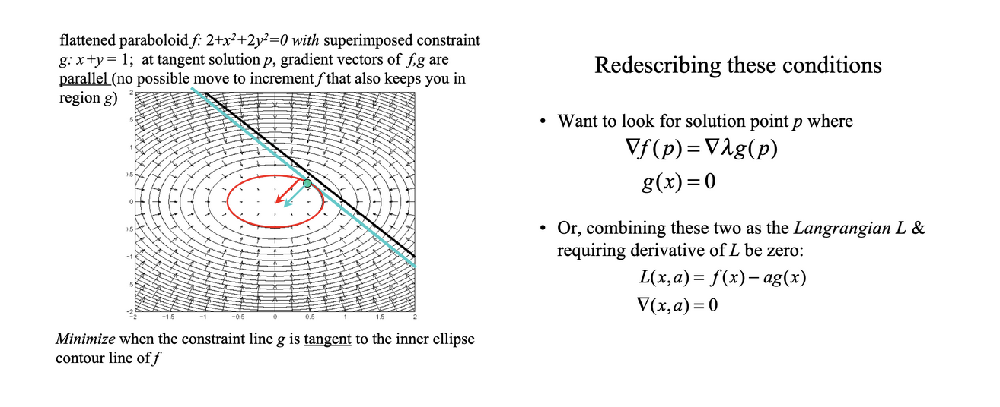

In [105]:
Image.open("svm.png")

3. [4 pts] Explain how the SVM framework can be extended in order to provide non-linear decision boundaries.

SVM is a linear classifier which learns an (n – 1) dimensional classifier for classification of data into two classes. However, it can be used for classifying a non-linear dataset. This can be done by projecting the dataset into a higher dimension in which it is linearly separable. By applying kernel functions, the samples are mapped onto a high-dimensional feature space, in which the linear classification is possible. Consider the following example:

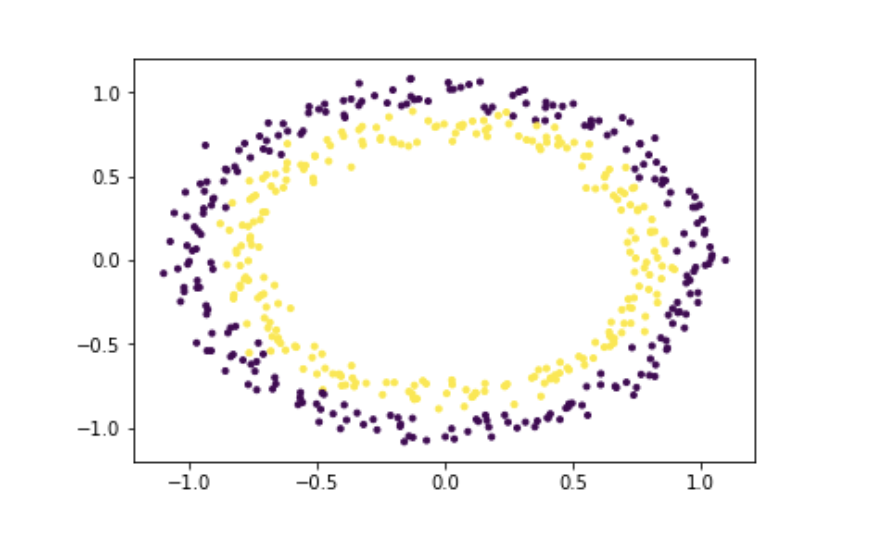

In [106]:
Image.open("svm2.png")

The dataset is clearly a non-linear dataset and consists of two features (say, X and Y).

In order to use SVM for classifying this data, introduce another feature Z = X2 + Y2 into the dataset. Thus, projecting the 2-dimensional data into 3-dimensional space. The first dimension representing the feature X, second representing Y and third representing Z (which, mathematically, is equal to the radius of the circle of which the point (x, y) is a part of). Now, clearly, for the data shown above, the ‘yellow’ data points belong to a circle of smaller radius and the ‘purple’ data points belong to a circle of larger radius. Thus, the data becomes linearly separable along the Z-axis.

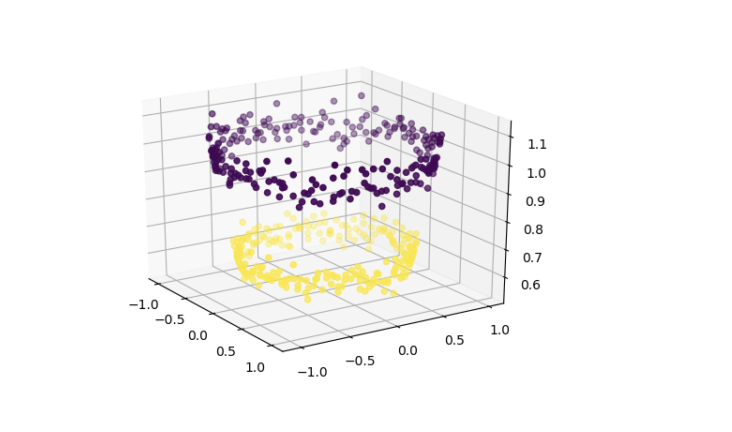

In [108]:
Image.open("sv3.png")

Note on Kernels: In machine learning, a trick known as “kernel trick” is used to learn a linear classifier to classify a non-linear dataset. It transforms the linearly inseparable data into a linearly separable one by projecting it into a higher dimension. A kernel function is applied on each data instance to map the original non-linear data points into some higher dimensional space in which they become linearly separable.